# Importing libraries

In [1]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup

import json
from pandas.io.json import json_normalize 

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN 
from sklearn import preprocessing
import sklearn.utils
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import r2_score

%matplotlib inline 
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns

#!conda install -c conda-forge folium=0.5.0 --yes
import folium

#!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim

import datetime

__Loading data__

In [2]:
df_hospitals = pd.read_csv('Data/df_hospitals.csv')
df_cases = pd.read_csv('Data/df_cases.csv')
df_cases_all = pd.read_csv('Data/df_cases_all.csv')
df_cases_date_total = pd.read_csv('Data/df_cases_date_total.csv')
df_cases_county_total = pd.read_csv('Data/df_cases_county_total.csv')

__Need to reassign the date column to timestamp beacause that's removed when saving the file in csv__

In [3]:
df_cases['date'] = pd.to_datetime(df_cases['date']) #converting the dates to timestamps
df_cases_all['date'] = pd.to_datetime(df_cases_all['date']) #converting the dates to timestamps
df_cases_date_total['date'] = pd.to_datetime(df_cases_date_total['date']) #converting the dates to timestamps


__Get the geographical location of USA__

In [4]:
address = 'USA'
geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of USA are {}, {}.'.format(latitude, longitude))

/Users/mohab1/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: Using Nominatim with the default "geopy/1.21.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  


The geograpical coordinate of USA are 39.7837304, -100.4458825.


# Model 1: DBSCAN --> identify clusters of cases in set time frames

__Optimizing the DBSCAN model by looping over the eps value of the model to maximize the Silhouette Coefficient of all the cluster. I am using Silhouette Coefficient because there is no ground truth. NOTE: the min_samples of the DBSCAN model is chosen to be the logarithmic of the number of counties at each time step__

In [5]:
#time_step defines the number of days to use DBSCAN to identify potential clusters
time_step = 7
first_day = df_cases_all['date'].iloc[0] + pd.to_timedelta(0, unit='D')
last_day = df_cases_all['date'].iloc[-1] - pd.to_timedelta(0, unit='D')
time_index = np.arange(0,(last_day - first_day + pd.to_timedelta(1, unit='D')).days , time_step)

#loop over each time_step
eps_range = np.linspace(1.00, 3.00, 50)
score_avg = []
for eps in eps_range:
    score = []
    for step_count, i in enumerate(np.flip(time_index)):     
        #get the corresponding date of the time step and then get all the cases on that date
        date = first_day + pd.to_timedelta(i, unit='D')
        temp = df_cases_all[df_cases_all['date'] == date].copy()

        #define the cluster dataset which will contain the geographical location and number of cases
        #use StandardScaler to scale the dataset
        Clus_dataSet = temp[['Latitude','Longitude', 'cases']]
        Clus_dataSet = preprocessing.StandardScaler().fit_transform(Clus_dataSet)

        #define the DBSCAN parameters. Here the min_samples is dynamic and depends on the number of counties that reported cases on a particular date
        min_samples = np.int(np.log(len(temp)))
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(Clus_dataSet)
        core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
        core_samples_mask[db.core_sample_indices_] = True
        labels = db.labels_
        temp["Clus_Db"]=labels

        realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
        clusterNum = len(set(labels)) 

        #Calculate the Silhouette Coefficient metric because there is no ground truth
        if len(set(labels)) > 1: 
            score.append(metrics.silhouette_score(Clus_dataSet, labels))

    score_avg.append(np.sum(score))

__Plotting all the eps values and the corresponding sum of Silhouette Coefficients of all clusters__ 

Text(0, 0.5, 'Sum of Silhouette Coefficients in all clusters')

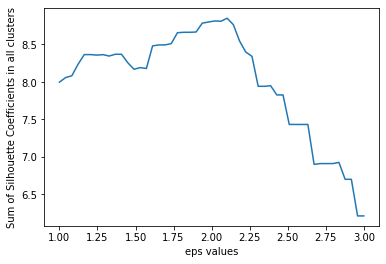

In [6]:
plt.plot(eps_range, score_avg)
plt.xlabel('eps values')
plt.ylabel('Sum of Silhouette Coefficients in all clusters')

__Pick the eps value that gives the highest Silhouette Coefficient__

In [7]:
best_eps = eps_range[np.argmax(score_avg)]
best_eps

2.1020408163265305

__Here we visualize the increase in the clusters of the number of counties that reported cases over specific time steps (7 days). You can clearly see how the situation evolved starting at day 0 in WA with one cluster and then slowly the clusters started to increase in size and spread towards the east.__

In [8]:
map_USA = folium.Map(location=[latitude, longitude], zoom_start=4)

#time_step defines the number of days to use DBSCAN to identify potential clusters
time_step = 7
first_day = df_cases_all['date'].iloc[0] + pd.to_timedelta(0, unit='D')
last_day = df_cases_all['date'].iloc[-1] - pd.to_timedelta(0, unit='D')
time_index = np.arange(0,(last_day - first_day + pd.to_timedelta(1, unit='D')).days , time_step)

text_loc = np.arange(len(time_index)) / 2
text_loc = np.flip(text_loc)
colo = plt.get_cmap('hot')(np.linspace(0.0, 1.0, len(time_index)))
colo_hex = []
for i in range(len(time_index)):
    colo_hex.append(colors.to_hex(colo[i]))
colo_hex = np.flip(colo_hex)

#loop over each time_step
for step_count, i in enumerate(np.flip(time_index)):     
    #get the corresponding date of the time step and then get all the cases on that date
    date = first_day + pd.to_timedelta(i, unit='D')
    temp = df_cases_all[df_cases_all['date'] == date].copy()
    print('Day: {}'.format(i))
    print(date)

    #define the cluster dataset which will contain the geographical location and number of cases
    #use StandardScaler to scale the dataset
    Clus_dataSet = temp[['Latitude','Longitude', 'cases']]
    Clus_dataSet = preprocessing.StandardScaler().fit_transform(Clus_dataSet)

    #define the DBSCAN parameters. Here the min_samples is dynamic and depends on the number of counties that reported cases on a particular date
    min_samples = np.int(np.log(len(temp)))
    db = DBSCAN(eps=best_eps, min_samples=min_samples).fit(Clus_dataSet)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    temp["Clus_Db"]=labels

    realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
    clusterNum = len(set(labels)) 

    print('Clusters: ',temp['Clus_Db'].unique())
    print('Min samples: ', min_samples)
    #Calculate the Silhouette Coefficient metric because there is no ground truth
    if len(set(labels)) > 1: 
        print('Silhouette Coefficient: %0.3f' % metrics.silhouette_score(Clus_dataSet, labels))
    print('')

    c= colo_hex[step_count]

    #creating popup markers to show the county name and the corresponding date (or Day since Day 1) when cases started to show up there 
    for lat, lng, county, state, cases in zip(temp['Latitude'], temp['Longitude'], temp['county'], temp['state_abb'], temp['cases']):
        label = '{}, {} - Day = {}'.format(county, state, i)
        label = folium.Popup(label, parse_html=True)

        folium.CircleMarker(
           [lat, lng],
           radius=2,
           popup=label,
           color=c,
           fill=True,
           fill_color=c,
           fill_opacity=0.7,
           line_opacity=0.7
        ).add_to(map_USA) 

    #creating dynamic popup markers for the clusters that change in size depending on size of the members of each cluster   
    for clust_number in  set(temp['Clus_Db']):        
        label = 'Cluster = {}, Day = {}'.format(clust_number, i)
        label = folium.Popup(label, parse_html=True)
        #c=(('#808080') if clust_number == -1 else colo_hex[np.int(clust_number)])
        clust_set = temp[temp['Clus_Db'] == clust_number]
        if clust_number != -1:
            cenx=np.mean(clust_set['Latitude']) 
            ceny=np.mean(clust_set['Longitude'])
            folium.CircleMarker(
               [cenx, ceny],
                #clusters change in size depending on size of the members of each cluster   
               radius=(np.int(15*np.log(len(clust_set))) if len(clust_set) != 1 else 5),
               popup=label,
               color=c,
               fill=True,
               fill_color=c,
               fill_opacity=0.7,
               line_opacity=0.7
            ).add_to(map_USA) 

            folium.map.Marker(
                [cenx-text_loc[step_count], ceny+text_loc[step_count]],
                icon=folium.features.DivIcon(
                    icon_size=(150,36),
                    icon_anchor=(0,0),
                    html='<div style="font-size: 12pt">' + 'Cluster: ' + str(clust_number) + ', Day: ' + str(i) + '</div>',
                    )
            ).add_to(map_USA)


map_USA

Day: 91
2020-04-21 00:00:00
Clusters:  [ 0 -1]
Min samples:  7
Silhouette Coefficient: 0.846

Day: 84
2020-04-14 00:00:00
Clusters:  [ 0 -1]
Min samples:  7
Silhouette Coefficient: 0.849

Day: 77
2020-04-07 00:00:00
Clusters:  [ 0 -1]
Min samples:  7
Silhouette Coefficient: 0.825

Day: 70
2020-03-31 00:00:00
Clusters:  [ 0 -1]
Min samples:  7
Silhouette Coefficient: 0.835

Day: 63
2020-03-24 00:00:00
Clusters:  [ 0 -1]
Min samples:  7
Silhouette Coefficient: 0.833

Day: 56
2020-03-17 00:00:00
Clusters:  [ 0 -1]
Min samples:  6
Silhouette Coefficient: 0.767

Day: 49
2020-03-10 00:00:00
Clusters:  [ 0 -1]
Min samples:  5
Silhouette Coefficient: 0.693

Day: 42
2020-03-03 00:00:00
Clusters:  [ 0 -1]
Min samples:  3
Silhouette Coefficient: 0.533

Day: 35
2020-02-25 00:00:00
Clusters:  [-1  0]
Min samples:  2
Silhouette Coefficient: 0.494

Day: 28
2020-02-18 00:00:00
Clusters:  [ 0  1 -1]
Min samples:  2
Silhouette Coefficient: 0.493

Day: 21
2020-02-11 00:00:00
Clusters:  [-1  0  1  2]
Min 

# Model 2: LSTM --> predict the number of cases in a given time frame

In [17]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

import math
import keras
from keras.preprocessing import sequence
from keras.layers import Dense
from keras.layers import Input, LSTM
from keras.models import Model
from keras import optimizers
import h5py

In [10]:
epochs = 500
batch_size = 8 #8
timesteps = 3 #3
sc = MinMaxScaler(feature_range=(0,1))

__Defining important functions. NOTE: parts of the code in the following cell is taken from the "Time Series Forecasting in the week 3 Applied AI with DeepLearning Coursera online course.__

In [11]:
#function to get the training data and set the percentage of the data to be tested on. The test data is not random (it is taken from the end of the dataset)
def get_train_data(dataset, batch_size, timesteps, test_percent):
    #get length of training data
    length = len(dataset)
    length *= 1 - test_percent
    train_length_values=[]
    for x in range(int(length)- 100, int(length)):
        modulo = x%batch_size
        if modulo ==0:
            train_length_values.append(x)
    
    length = max(train_length_values)
    
    #get training set data
    upper_train = length + timesteps*2
    df_train = dataset[0:upper_train]
    training_set = df_train.loc[:,'cases'].values.reshape(-1,1)
    date_training = df_train.loc[:,'date'].values.reshape(-1,1)
    
    #scale and reshape the training set data
    training_set_scaled = sc.fit_transform(np.float64(training_set))
    training_set_scaled.shape
    
    #prepare x and y training data for the LSTM model
    x_train = []
    y_train = []
    for i in range(timesteps, length+timesteps):
        x_train.append(training_set_scaled[i-timesteps:i,0])
        y_train.append(training_set_scaled[i:i+timesteps,0])
        
    x_train = np.array(x_train)
    y_train = np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
    y_train = np.reshape(y_train, (y_train.shape[0], y_train.shape[1], 1))

    return x_train, y_train, training_set, date_training

#function that defines the LSTM model
def LSTM_model(batch_size, timesteps, optimizer, loss):
    keras.backend.clear_session()
    inputs = Input(batch_shape=(batch_size, timesteps, 1))
    lstm_1 = LSTM(20, stateful=True, return_sequences=True)(inputs)
    lstm_2 = LSTM(20, stateful=True, return_sequences=True)(lstm_1)
    outputs = Dense(units=1)(lstm_2)

    model = Model(inputs=inputs, outputs = outputs)
    #adam = optimizers.Adam(learning_rate=lr, beta_1=0.9, beta_2=0.999, amsgrad=False)
    model.compile(optimizer = optimizer , loss = loss, metrics = ['accuracy'])
    #model.summary()
    
    return model

#function to train the LSTM model
def train(x_train, y_train, batch_size, epochs):
    losses = []
    for i in range(epochs):
        #print("Epoch: " + str(i+1))
        History = model.fit(x_train, y_train, shuffle=False, epochs=1, batch_size=batch_size, verbose=0)
        losses.append(History.history['loss'][0])
        model.reset_states()
    
    #plt.semilogy(losses)
    return losses

#function to get the test data (from the end of the dataset but doesn't include the training data)        
def get_test_data(dataset, x_train, batch_size, timesteps):
    #get length of test data
    upper_train = len(x_train) + timesteps*2
    test_length_values = []
    for x in range(len(dataset) - 100, len(dataset) - timesteps*2):
        modulo = (x-upper_train)%batch_size
        if modulo == 0:
            test_length_values.append(x)
    
    test_length = max(test_length_values)
    
    #get test set data
    upper_test = test_length + timesteps*2
    testset_length = test_length - upper_train
    df_test = dataset[upper_train:upper_test]
    test_set = df_test.loc[:,'cases'].values.reshape(-1,1)
    date_test = df_test.loc[:,'date'].values.reshape(-1,1)
    #print(test_set)
    
    #scale and reshape the test set data
    test_set_scaled = sc.fit_transform(np.float64(test_set))
    test_set_scaled.shape
    
    #prepare x_test data for the LSTM model
    x_test = []
    for i in range(timesteps, testset_length+timesteps):
        x_test.append(test_set_scaled[i-timesteps:i,0])
        
    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))
    
    #prepare the real data
    y_test = test_set[2*timesteps-1:testset_length+2*timesteps-1]
    date_test = date_test[2*timesteps-1:testset_length+2*timesteps-1]
    
    return x_test, y_test, date_test    

#function to get prediction after training the model
def get_prediction(model, x_test, batch_size, timesteps):
    #make prediction with the LSTM model
    y_hat_raw = model.predict(x_test, batch_size=batch_size)
    model.reset_states()
    
    #reshape the prediction output
    y_hat_raw = np.reshape(y_hat_raw, (y_hat_raw.shape[0], y_hat_raw.shape[1]))
    
    #rescaling 
    y_hat_raw = sc.inverse_transform(y_hat_raw)
    
    #prepare y_hat
    testset_length = len(x_test)
    y_hat = []
    for i in range(0, testset_length):
        y_hat.append(y_hat_raw[i, timesteps-1])
        
    #reshape y_hat/predicted data 
    y_hat = np.array(y_hat)
    y_hat = np.reshape(y_hat, (y_hat.shape[0], 1))
       
    return y_hat


In [12]:
x_train, y_train, training_set, date_training = get_train_data(df_cases_date_total, batch_size, timesteps, test_percent = 0.2)

In [13]:
x_test, y_test, date_test = get_test_data(df_cases_date_total, x_train, batch_size, timesteps)

__Mini-grid search to find the best optimizer and loss function__

In [14]:
optimizer_list = ['RMSprop', 'Adam']
loss_list = ['mean_squared_error', 'mean_absolute_error']
for optimizer in optimizer_list:
    for loss in loss_list: 
        model = LSTM_model(batch_size, timesteps, optimizer = optimizer, loss = loss) 
        losses = train(x_train, y_train, batch_size, epochs)
        y_hat = get_prediction(model, x_test, batch_size, timesteps)
        r2 = r2_score(y_test, y_hat)
        print('Model-' + optimizer + '-' + loss + '-' + str(round(r2,3)))
        model.save('Model-' + optimizer + '-' + loss + '-' + str(round(r2,3)) +'.h5')


Model-RMSprop-mean_squared_error-0.702
Model-RMSprop-mean_absolute_error-0.93
Model-Adam-mean_squared_error-0.946
Model-Adam-mean_absolute_error-0.954


__Use the model that gives the best R2 score and make prediction__

In [16]:
model = keras.models.load_model('Model-Adam-mean_absolute_error-0.954' + '.h5')

In [18]:
y_hat = get_prediction(model, x_test, batch_size, timesteps)

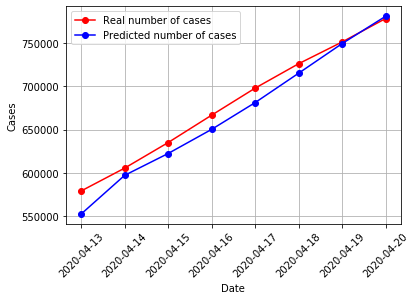

In [20]:
#plt.semilogy(time_training, training_set, color = 'black', label = 'Training data set')
plt.plot(date_test, y_test, '-o', color = 'red', label = 'Real number of cases')
plt.plot(date_test, y_hat, '-o', color = 'blue', label = 'Predicted number of cases')
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('Cases')
plt.grid()
plt.legend()
plt.show()

In [21]:
r2 = r2_score(y_test, y_hat)
print('R2 Score: ', r2)

R2 Score:  0.9538994628591984


In [22]:
#model.save('model.h5')

__Get the most recent batch of cases in the dataset (at the end of the dataset) and then make a future prediction with same size as the timesteps which is 3 days in this case. So we can predict the number of cases in 3 days in the future__

In [42]:
no_batches = batch_size * 5;
#no_batches = len(x_train) + len(x_test) #+ batch_size
recent_cases = df_cases_date_total['cases'].tolist()[-no_batches-timesteps+1:]
recent_date = df_cases_date_total['date'].tolist()[-no_batches-timesteps+1:]
x = []
for i in range(0, no_batches):
    x.append(recent_cases[i:i+timesteps]) 
x = np.array(x)
x = sc.fit_transform(np.float64(x))
x = np.reshape(x, (x.shape[0], x.shape[1], 1))
x.shape

(40, 3, 1)

__predict the number of cases in 3 days (timestep) in the future__

In [43]:
predicted_cases = get_prediction(model, x, batch_size, timesteps)
predicted_date = [date + pd.to_timedelta(timesteps, unit='D') for date in recent_date[timesteps-1:]]

__It seems that the model predicts a continous increase in cases till April 25th__

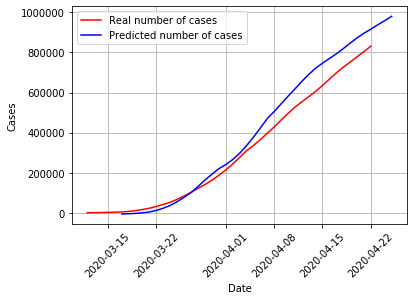

In [44]:
plt.plot(recent_date, recent_cases, color = 'red', label = 'Real number of cases')
plt.plot(predicted_date, predicted_cases, color = 'blue', label = 'Predicted number of cases')
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('Cases')
plt.grid()
plt.legend()
plt.show()